In [4]:
import random
import matplotlib.pyplot as plt
from scipy.stats import qmc
import time
import numpy as np

In [5]:
def monte_carlo_pi(num_samples):
    inside_circle = 0
    pi_values = []
    points_inside_x = []
    points_inside_y = []
    points_outside_x = []
    points_outside_y = []

    for i in range(1, num_samples+1):
        x = random.uniform(0, 1)
        y = random.uniform(0, 1)

        distance = x**2 + y**2

        if distance <= 1:
            inside_circle += 1
            points_inside_x.append(x)
            points_inside_y.append(y)
        else:
            points_outside_x.append(x)
            points_outside_y.append(y)
            
        pi_estimate = (inside_circle / i) * 4
        pi_values.append(pi_estimate)


    estimated_pi = (inside_circle / num_samples) * 4

    return pi_values, [points_inside_x, points_inside_y], [points_outside_x, points_outside_y]

In [6]:
num_samples = 1005000

pi_values, inside, outsidey = monte_carlo_pi(num_samples)
estimated_pi = pi_values[-1]
print(f"Con {num_samples} punto se estimó el valor {estimated_pi}")

Con 1005000 punto se estimó el valor 3.143387064676617


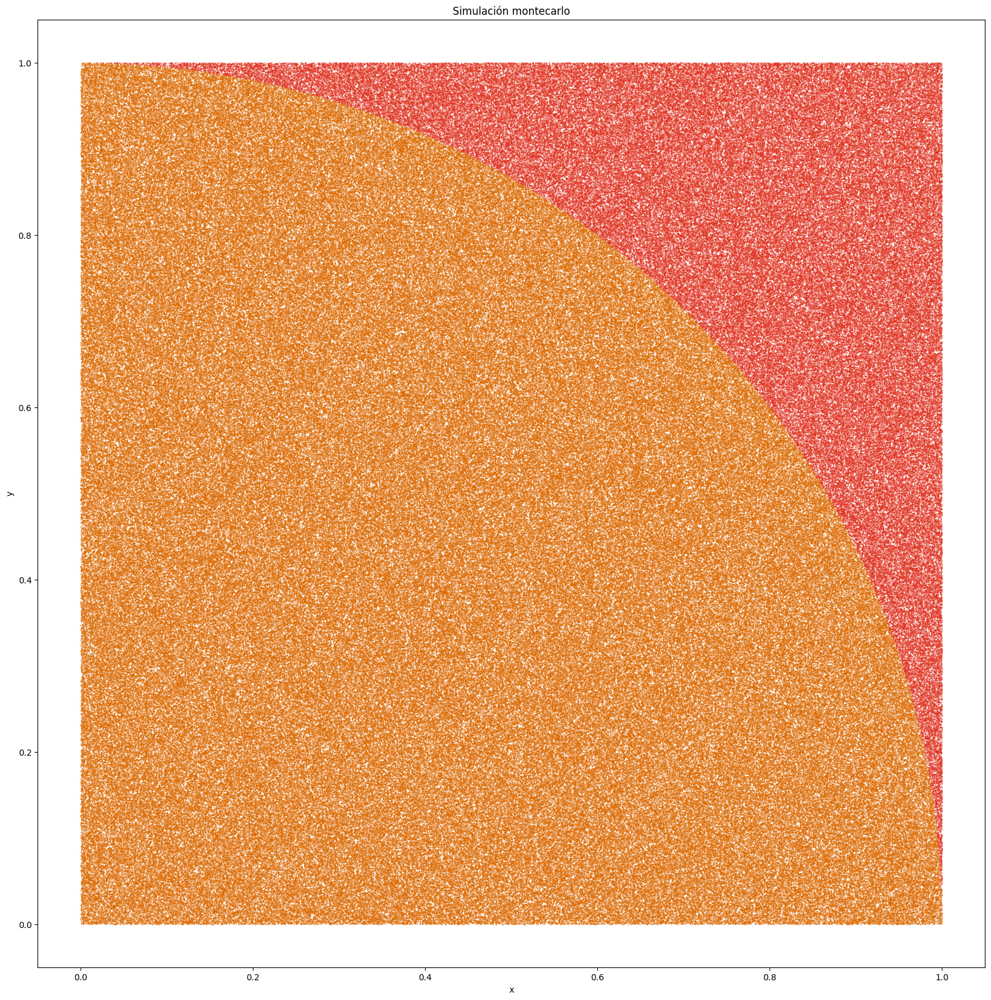

In [8]:
plt.figure(figsize=(20,20))
plt.scatter(inside[0], inside[1], color='#dc6900', marker='.', s=0.5)
plt.scatter(outsidey[0], outsidey[1], color='#e0301e', marker='.', s=0.5)


plt.gca().set_aspect('equal', adjustable='box')

plt.title('Simulación montecarlo')
plt.xlabel('x')
plt.ylabel('y')
plt.show()


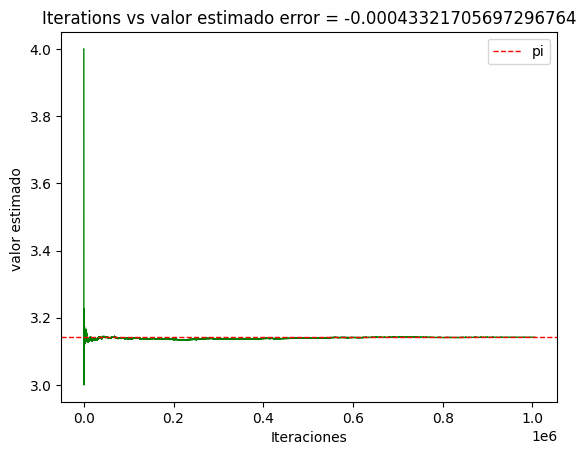

In [6]:
error = 3.141592653589793 - estimated_pi
plt.plot(range(1, num_samples + 1), pi_values, color='green', linestyle='-',linewidth=1)
plt.axhline(y=3.141592653589793, color='r', linestyle='--', label='pi', linewidth=1)
plt.title(f'Iterations vs valor estimado error = {error}')
plt.xlabel('Iteraciones')
plt.ylabel('valor estimado ')
plt.legend()
plt.show()

In [7]:
def monte_carlo_pi_halton(num_samples):
    sampler = qmc.Halton(d=2, scramble=False)
    sample = sampler.random(n=num_samples)
    inside_circle = 0
    pi_values = []
    points_inside_x = []
    points_inside_y = []
    points_outside_x = []
    points_outside_y = []

    for i,element in enumerate(sample):
        x=element[0]
        y=element[1]
        distance = x**2 + y**2

        if distance <= 1:
            inside_circle += 1
            points_inside_x.append(x)
            points_inside_y.append(y)
        else:
            points_outside_x.append(x)
            points_outside_y.append(y)
            
            
        pi_estimate = (inside_circle /(1+i)) * 4
        pi_values.append(pi_estimate)


    estimated_pi = (inside_circle / num_samples+1) * 4

    return pi_values, points_inside_x, points_inside_y, points_outside_x, points_outside_y

In [8]:
n=1000000

h_pi_values, h_point_inside_x, h_point_inside_y, h_points_outside_x, h_point_outside_y = monte_carlo_pi_halton(n)

In [9]:
h_estimated_pi = h_pi_values[-1]
print(f"Con {n} puntos y la secuencia de halton se estimó el valor {h_estimated_pi}")

Con 1000000 puntos y la secuencia de halton se estimó el valor 3.141572


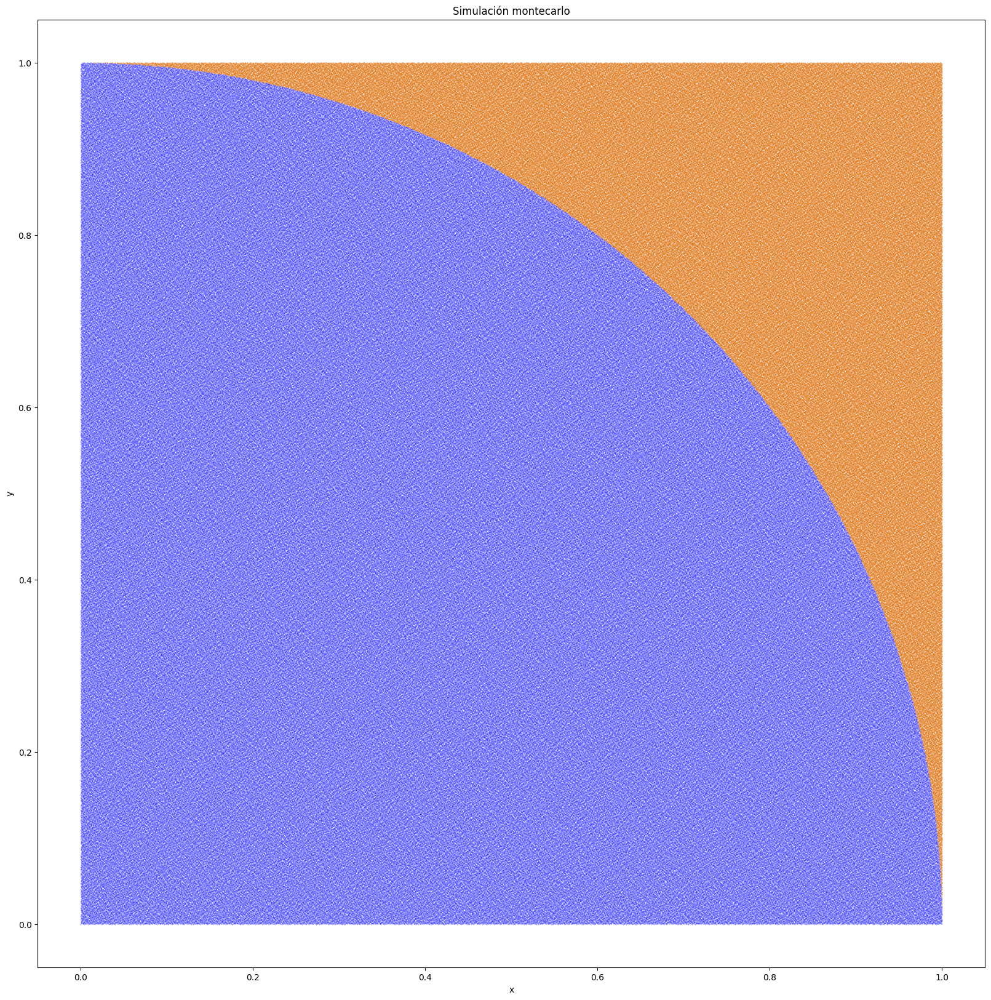

In [12]:
plt.figure(figsize=(20,20))
plt.scatter(h_point_inside_x, h_point_inside_y, color='blue', marker='.', s=0.5, alpha=0.5)
plt.scatter(h_points_outside_x, h_point_outside_y, color='#dc6900', marker='.',s=0.5, alpha=0.8)


plt.gca().set_aspect('equal', adjustable='box')

plt.title('Simulación montecarlo')
plt.xlabel('x')
plt.ylabel('y')
plt.show()


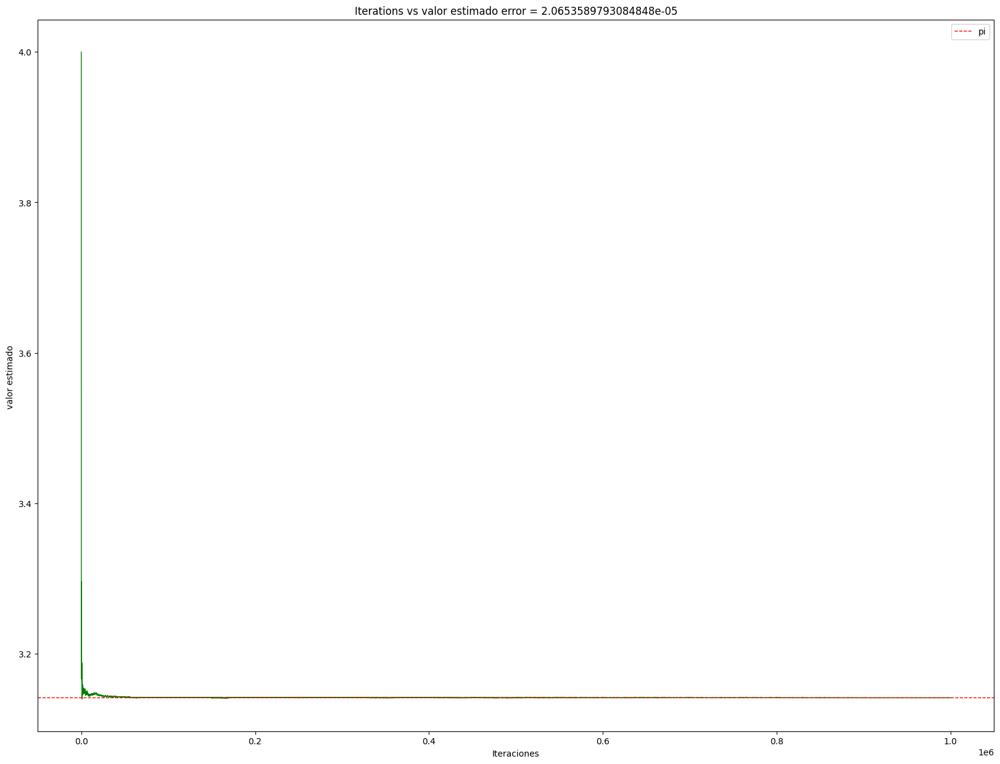

In [13]:
error_h = 3.141592653589793 - h_estimated_pi
plt.figure(figsize=(20,15))
plt.plot(range(1, n + 1), h_pi_values, color='green', linestyle='-',linewidth=1)
plt.axhline(y=3.141592653589793, color='r', linestyle='--', label='pi', linewidth=1)
plt.title(f'Iterations vs valor estimado error = {error_h}')
plt.xlabel('Iteraciones')
plt.ylabel('valor estimado ')
plt.legend()
plt.show()

In [7]:
time.time()

1701298496.5365667

In [8]:
def congruencia_lineal(n,a,b,c):
    seed = int(time.time())
    lista3 =[]
    for i in range(n):
        xn =(a * seed + b) % c
        seed = xn 
        lista3.append(xn)
    lista4=[element/max(lista3) for element in lista3]
    return lista4


In [29]:
def monte_carlo_pi_cl(num_samples,a,b,c):
    inicio= time.time()
    inside_circle = 0
    pi_values = []
    points_inside_x = []
    points_inside_y = []
    points_outside_x = []
    points_outside_y = []
    
    l=congruencia_lineal(num_samples,a,b,c)
    bl=np.array(l[0:num_samples])
    al=np.array(l[num_samples:])
    

    for i in range(1,num_samples+1):
        x = al[1-i]
        y = bl[i-1]

        distance = x**2 + y**2

        if distance <= 1:
            inside_circle += 1
            points_inside_x.append(x)
            points_inside_y.append(y)
        else:
            points_outside_x.append(x)
            points_outside_y.append(y)
            
        pi_estimate = (inside_circle / i) * 4
        pi_values.append(pi_estimate)


    estimated_pi = (inside_circle / num_samples) * 4
    final = time.time()
    print(final-inicio)

    return pi_values, points_inside_x, points_inside_y, points_outside_x, points_outside_y

In [37]:
m = 100
a = 1103515245
b = 12345
c = 2**31
pi_values_cl, points_inside_x_cl, points_inside_y_cl, points_outside_x_cl, points_outside_y_cl = monte_carlo_pi_cl(m,a,b,c)



0.0004363059997558594


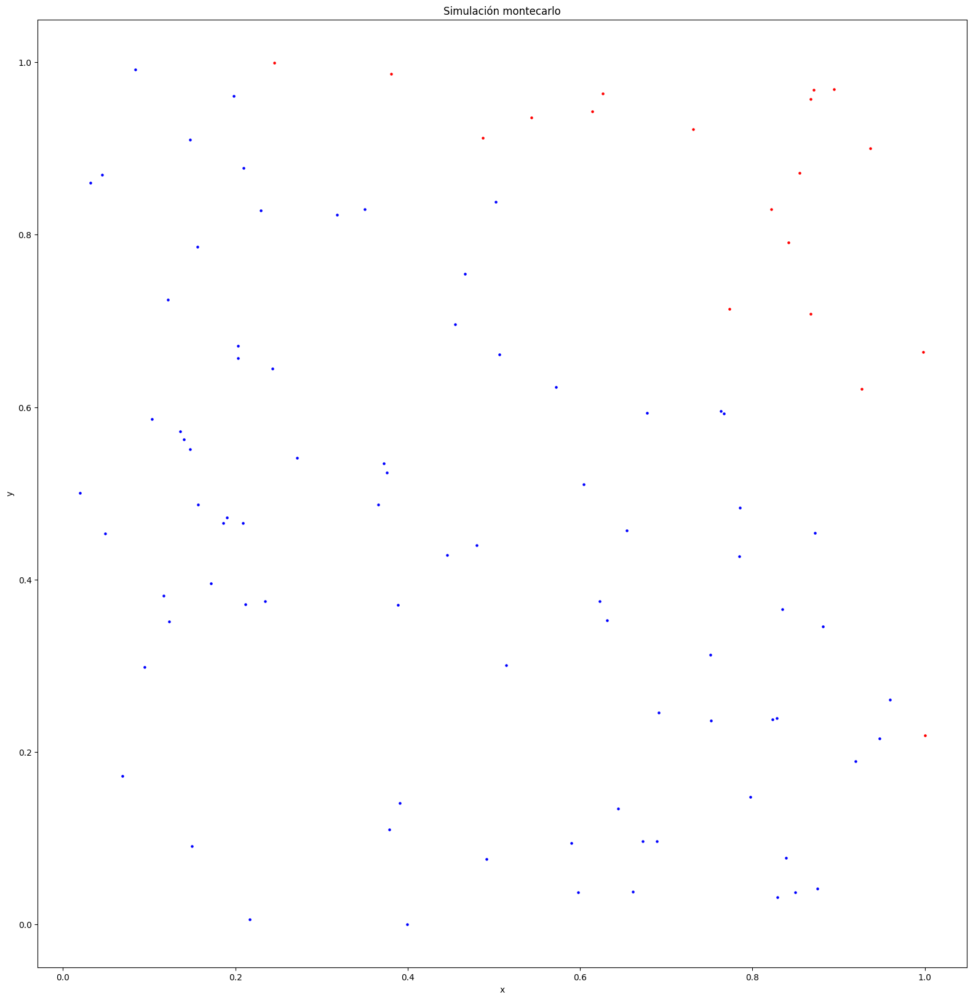

In [38]:
plt.figure(figsize=(20,20))
plt.scatter(points_inside_x_cl, points_inside_y_cl, color='blue', marker='.', s=20)
plt.scatter(points_outside_x_cl, points_outside_y_cl, color='red', marker='.',s=20)


plt.gca().set_aspect('equal', adjustable='box')

plt.title('Simulación montecarlo')
plt.xlabel('x')
plt.ylabel('y')
plt.show()


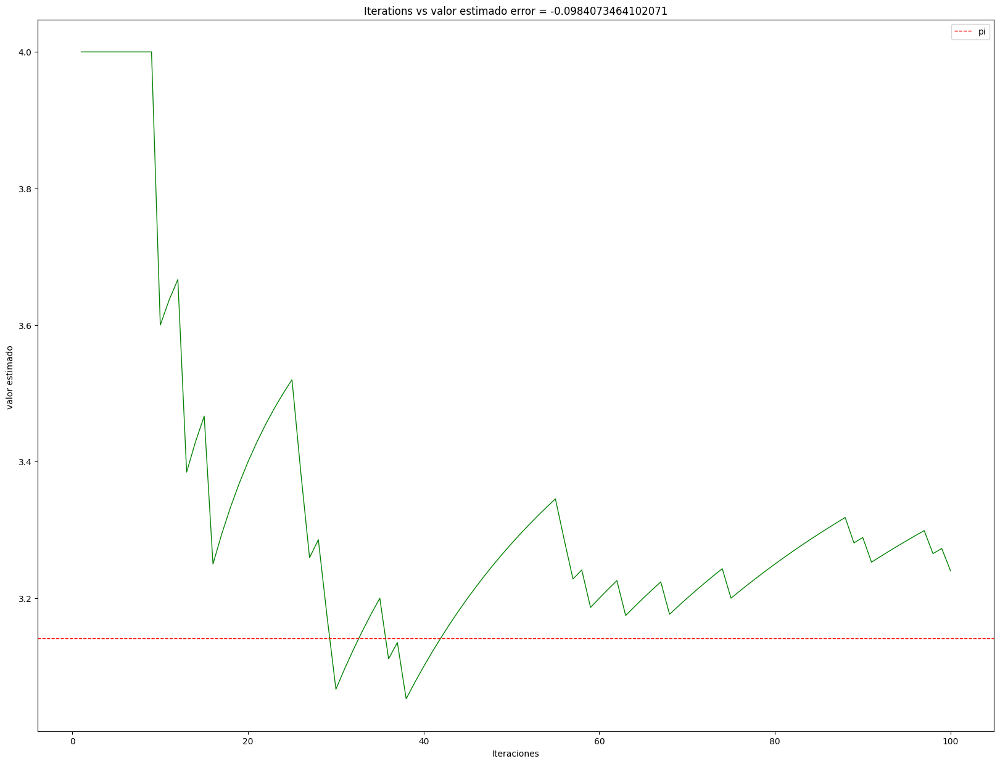

In [41]:
error_h = 3.141592653589793 - pi_values_cl[-1]
plt.figure(figsize=(20,15))
plt.plot(range(1, m + 1), pi_values_cl, color='green', linestyle='-',linewidth=1)
plt.axhline(y=3.141592653589793, color='r', linestyle='--', label='pi', linewidth=1)
plt.title(f'Iterations vs valor estimado error = {error_h}')
plt.xlabel('Iteraciones')
plt.ylabel('valor estimado ')
plt.legend()
plt.show()

In [42]:
print(pi_values_cl[-1])

3.24


In [59]:
num_samples = 10
sampler = qmc.Halton(d=2, scramble=False)
sample = sampler.random(n=num_samples)

In [60]:
print(sample)

[[0.         0.        ]
 [0.5        0.33333333]
 [0.25       0.66666667]
 [0.75       0.11111111]
 [0.125      0.44444444]
 [0.625      0.77777778]
 [0.375      0.22222222]
 [0.875      0.55555556]
 [0.0625     0.88888889]
 [0.5625     0.03703704]]


In [63]:
sampler2 = qmc.Halton(d=2, scramble=False)
sample2 = sampler.random(n=num_samples)

In [64]:
print(sample2)

[[0.3125     0.37037037]
 [0.8125     0.7037037 ]
 [0.1875     0.14814815]
 [0.6875     0.48148148]
 [0.4375     0.81481481]
 [0.9375     0.25925926]
 [0.03125    0.59259259]
 [0.53125    0.92592593]
 [0.28125    0.07407407]
 [0.78125    0.40740741]]


In [43]:
x =sample.reshape((1,2*len(sample)))

In [44]:
print(min(x[0]))

0.0
